In [42]:
import numpy as np
import matplotlib.pyplot as plt

In [43]:
class Atom:
    def __init__(self, x, v, m, R):
        self.m = m
        self.R = R
        x = np.array(x)
        v = np.array(v)
        self.x = np.copy(x)
        self.v = np.copy(v)
        self.xs = [np.copy(x)]
        self.vs = [np.copy(v)]
        
    def propagate(self, t):
        self.x += self.v*t
        self.xs.append(np.copy(self.x))
        
    def reflect(self, wall):
        c1 = -np.dot(self.v, wall.n)
        assert c1 < 0
        self.v += 2 * c1 * wall.n
        self.vs.append(np.copy(self.v))
        
    def collide(self, atom):
        d = atom.x - self.x
        u = atom.v - self.v
        norm = np.linalg.norm(d)
        M = atom.m + self.m
        self.v += d * 2 * atom.m/M * np.dot(u, d) / np.dot(d, d)
        atom.v += d * 2 * self.m/M * np.dot(u, -d) / np.dot(d, d)
        
    def within_walls(self, walls):
        return np.all([np.dot(self.x - wall.c, wall.n)<0 for wall in walls])
    
    def not_overlapped(self, atom):
        return np.linalg.norm(atom.x - self.x) > self.R + atom.R
        
        
    def intersect_wall(self, wall):
        if np.dot(wall.n, self.v) < 1e-7:
            t = np.inf
        else:
            t = np.dot(wall.n, wall.c-wall.n*self.R - self.x) / np.dot(wall.n, self.v)
            if t <= 1e-7:
                t = np.inf
        return t
    
    def intersect_atom(self, atom):
        d = atom.x - self.x
        u = atom.v - self.v
        a = np.dot(u, u)
        b = 2 * np.dot(u, d)
        c = np.dot(d, d) - (atom.R + self.R)**2
        if b*b > 4*a*c and c > 1e-7:
            t1 = (-b + np.sqrt(b**2 - 4*a*c)) / (2*a)
            t2 = (-b - np.sqrt(b**2 - 4*a*c)) / (2*a)
            ts = np.array([t1, t2])
            ts[ts<=1e-7] = np.inf
            return np.min(ts)
        else:
            return np.inf
        
    def plot(self, ax, color="k"):
        xs, ys = np.array(self.xs).T
        #t = self.x[0] + np.linspace(-self.R, self.R, 100)
        #c =np.sqrt(self.R*self.R - (t-self.x[0])**2)
        #ax.plot(t,  self.x[1] + c, color="k")
        #ax.plot(t,  self.x[1] - c, color="k")
        ax.add_patch(plt.Circle(self.x, self.R,  color=color))
        ax.plot(xs, ys, color=color)
        
class Wall:
    def __init__(self, c, n):
        self.c = np.array(c)
        self.n = np.array(n) / np.linalg.norm(n)
        
        
def next_collision(atoms, walls):
    walls = np.atleast_1d(walls)
    atoms = np.atleast_1d(atoms)
    # next atom-atom collision
    t_collision_options = np.ones((len(atoms), len(atoms))) * np.inf
    for i in range(len(atoms)):
        for j in range(i+1, len(atoms)):
            t_collision_options[i, j] = atoms[i].intersect_atom(atoms[j])
    i, j = np.unravel_index(t_collision_options.argmin(), t_collision_options.shape)
    t_collision = t_collision_options[i, j]    
    # next atom-wall collision
    t_wall_options = np.ones((len(atoms), len(walls))) * np.inf
    for k in range(len(atoms)):
        for l in range(len(walls)):
            t_wall_options[k, l] = atoms[k].intersect_wall(walls[l]) 
    k, l = np.unravel_index(t_wall_options.argmin(), t_wall_options.shape)
    t_wall = t_wall_options[k, l]
    

    if t_collision < t_wall:
        for atom in atoms:
            atom.propagate(t_collision)
        atoms[i].collide(atoms[j])
    else:
        for atom in atoms:
            atom.propagate(t_wall)
        atoms[k].reflect(walls[l])
        
def initialize_atoms(walls, N, size, T, m, R, atoms=None):
    if atoms is None:
        atoms = []
    while len(atoms) < N:
        x = np.random.uniform(-size, size, 2)
        v = np.random.normal(0,1,2)
        atom = Atom(x, v, m, R)
        if atom.within_walls(walls):
            if len(atoms) == 0:
                atoms.append(atom)
            else:
                if np.all([atom.not_overlapped(existing_atom) for existing_atom in atoms]):
                    atoms.append(atom)
    return atoms
        
    

In [44]:
# triangle


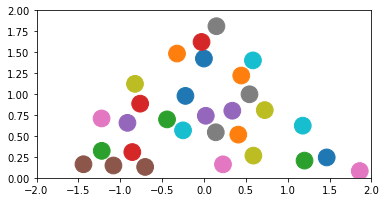

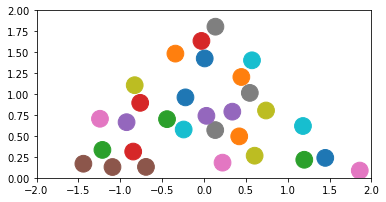

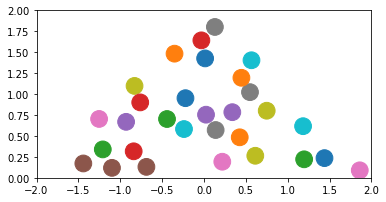

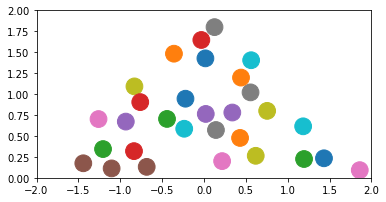

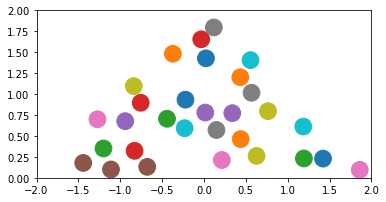

...

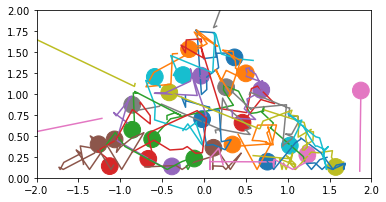

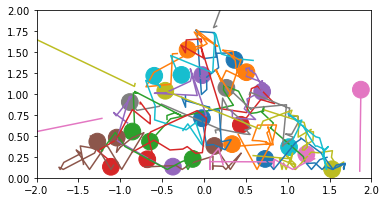

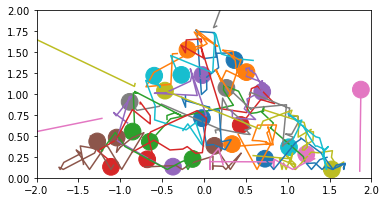

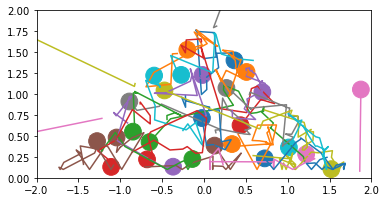

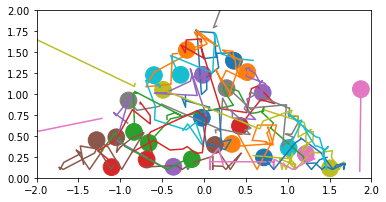

KeyboardInterrupt: 

In [45]:
atoms = initialize_atoms(walls, 30, 2, 1, 1, 0.1)

walls = [Wall([0, -1], [0, -1]),
         Wall([-1, 1], [-1, 0]),
         Wall([1, 1], [1, 0]),
         Wall([0, 1], [0, 1])]

walls = [Wall([0, 0], [0, -1]),
         Wall([-1, 1], [-1, 1]),
         Wall([1, 1], [1, 1])]


for i in range(1000):
    next_collision(atoms, walls)
    fig, ax = plt.subplots(1,1)
    ax.set_aspect(1)
    ax.set_ylim(0,2)
    ax.set_xlim(-2,2)

    for atomi, atom in enumerate(atoms):
        color = f"C{atomi}"
        atom.plot(ax, color=color)
    plt.show()
    


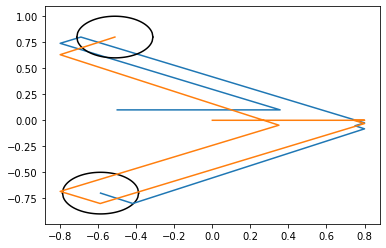

In [232]:
fig, ax = plt.subplots(1,1)
atoms[0].plot(ax)
atoms[1].plot(ax)

<ipython-input-213-417b5e4a2dcb>:57: RuntimeWarning: invalid value encountered in sqrt
  c = self.x[1] + np.sqrt(self.R*self.R - (t-self.x[0])**2)


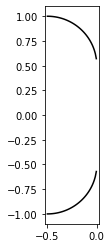

In [217]:
atom = Atom([-0.5, 0.5], [1, 0], 1, 0.5)
fig, ax = plt.subplots(1,1)
atom.plot(ax)
ax.set_aspect(1)

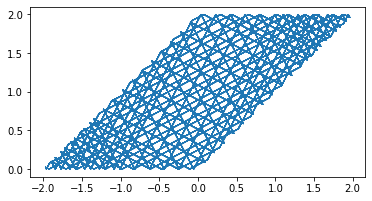

In [5]:
# parallelogram
atom = Atom([0.2, 1], [2.1, 1.1])
walls = [Wall([0, 0], [0, -1]),
         Wall([-1, 1], [-1, 1]),
         Wall([1, 1], [-1, 1]),
         Wall([0, 2], [0, 1])]
for i in range(1000):
    atom.intersect(walls)
    atom.reflect()
fig, ax = plt.subplots(1,1)
ax.plot(*np.array(atom.xs).T, lw=1)
ax.set_aspect(1)

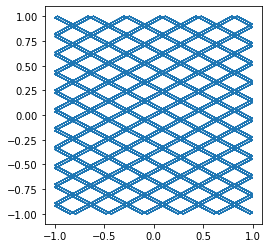

In [14]:
# square
atom = Atom([0.2, 0.5], [2.1, 1.1])
walls = [Wall([0, -1], [0, -1]),
         Wall([-1, 1], [-1, 0]),
         Wall([1, 1], [1, 0]),
         Wall([0, 1], [0, 1])]
for i in range(1000):
    atom.intersect(walls)
    atom.reflect()
fig, ax = plt.subplots(1,1)
ax.plot(*np.array(atom.xs).T, lw=1)
ax.set_aspect(1)

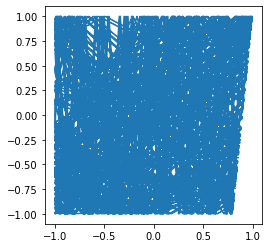

In [11]:
# deformed square
atom = Atom([-0.5, 0.5], [2.1, 1.1])
walls = [Wall([0, -1], [0, -1]),
         Wall([-1, 1], [-1, 0]),
         Wall([1, 1], [1, -0.1]),
         Wall([0, 1], [0, 1])]
for i in range(1000):
    atom.intersect(walls)
    atom.reflect()
fig, ax = plt.subplots(1,1)
ax.plot(*np.array(atom.xs).T, lw=1)
ax.set_aspect(1)

In [39]:
atom.xs

[array([-0.5,  0.5])]

In [ ]:
atom.vs

In [ ]:
atom.xs

In [ ]:
# square
x = np.random.uniform(-1, 1, 2)
v = np.random.normal(0, 1, 2)

atom = Atom([0.2, 0.5], [2.1, 1.1])
walls = [Wall([0, -1], [0, -1]),
         Wall([-1, 1], [-1, 0]),
         Wall([1, 1], [1, 0]),
         Wall([0, 1], [0, 1])]
for i in range(1000):
    atom.intersect(walls)
    atom.reflect()
fig, ax = plt.subplots(1,1)
ax.plot(*np.array(atom.xs).T, lw=1)
ax.set_aspect(1)